In [1]:
import IPython.display as ipd
import scipy.io.wavfile as wav
from scipy.fftpack import dct
from zipfile import ZipFile
import numpy as np
import pandas as pd
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import librosa as lr
import python_speech_features
from scipy.stats import skew
from sklearn import preprocessing
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score
from IPython.core.interactiveshell import InteractiveShell
from sklearn.model_selection import GridSearchCV

import matplotlib.pyplot as plt
InteractiveShell.ast_node_interactivity = "all"

In [2]:
def audio_plot(audio_file):
    audio, Fs = lr.load(audio_file) #Fs is the sampling rate

    #print(audio.size/Fs) #gives the time duration of the audio signal
    #print(Fs)

    Ts = 1.0/Fs #Time step of a single sample
    t = np.arange(0, len(audio)/Fs, Ts) #time vector

    N = len(audio) #total number of samples
    #k = numpy.arange(N)
    #T = N/Fs #time duration of the audio signal
    #f = k/T #since I need total 'k' samples in the time duration of the audio
    f = np.fft.fftfreq(N, d=Ts)

    fft_audio = np.fft.fft(audio)/N

    fig, ax = plt.subplots(2, 1, figsize=(12, 4))
    ax[0].plot(t, audio)
    ax[0].set_xlabel('Time')
    ax[0].set_ylabel('Amplitude')
    
    ax[1].plot(f/1000, abs(fft_audio)) 
    ax[1].set_xlabel('Freq (KHz)')
    ax[1].set_ylabel('|Y(freq)|')


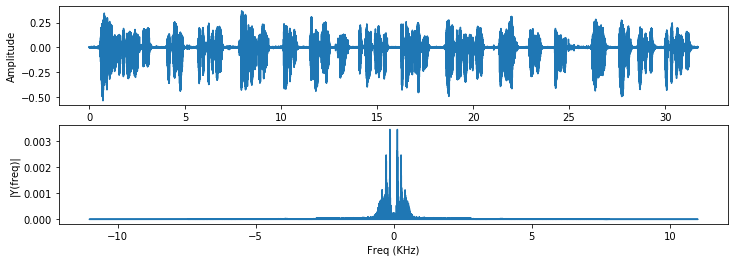

In [6]:
audio_plot('./Read_Up/IDR2/5.wav')

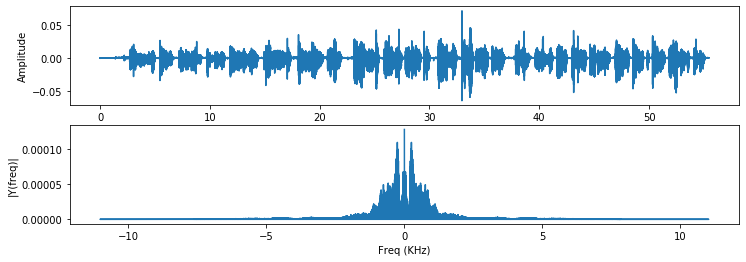

In [7]:
audio_plot('./Read_Up/IDR1/5.wav')

In [4]:
#data import
def audio_import(nclass, naudio):
    rate, data = wav.read('Read_Up/IDR' + str(nclass) + '/' + str(naudio) + '.wav')
    filename = 'Data/IDR' + str(nclass) + '/' + str(naudio) + '.csv'
    return rate, data, filename

#parameters
framelength, framestride, nfft, num_fbanks, n_cep_coeff = 0.025, 0.015, 512, 40, 12

#generate frames
def frames_gen(rate, data, framelength, framestride):
    frmlen, frmstrd, signallen = int(round(rate*framelength)), int(round(rate*framestride)), len(data)
    paddinglen = frmstrd - (signallen - frmlen) % frmstrd #making number of frames even
    paddedsig = np.concatenate((data, np.zeros(paddinglen)), axis = 0)
    paddedsiglen = len(paddedsig)
    nframes = int(np.floor((paddedsiglen - frmlen)/frmstrd) + 1)
    indices = np.tile(np.arange(0, frmlen), (nframes, 1)) + np.tile((np.arange(0, nframes*frmstrd, frmstrd)), (frmlen, 1)).T
    frames = paddedsig[indices]
    return frames, frmlen

#apply hamming window to each frame
def hamming_window(frames, frmlen):
    frames *= np.hamming(frmlen)
    return frames

#convert each windowed frame into a power spectrum
def periodogram_gen(frames, nfft):
    frame_fft = np.absolute(np.fft.rfft(frames, n = nfft, axis = 1))
    frame_periodogram = np.square(frame_fft)/nfft
    return frame_periodogram

def freq_to_mel(freq):
    return 2595*np.log10(1+freq/700)
def mel_to_freq(mel):
    return 700*(np.power(10, mel/2595) - 1)

# making mel-scale filterbank
def filter_bank_gen(rate, num_fbanks, nfft):
    #for x filter banks, we need x+2 mel points
    low_mel_lim = 0
    up_mel_lim = freq_to_mel(rate/2)
    mel_range = np.linspace(0, up_mel_lim, num_fbanks + 2)
    freq_range = mel_to_freq(mel_range)
    bins = np.floor((nfft + 1) * freq_range/rate)
    fbank = np.zeros((num_fbanks, int(np.floor(nfft/2 + 1))))
    for m in range(1, num_fbanks + 1):
        lower = int(bins[m - 1]) # lower
        peak = int(bins[m]) # peak
        upper = int(bins[m + 1]) # upper
        for k in range(lower, peak):
            fbank[m - 1, k] = (k - bins[m - 1])/(bins[m] - bins[m - 1])
        for k in range(peak, upper):
            fbank[m - 1, k] = (bins[m + 1] - k)/(bins[m + 1] - bins[m])
    return fbank

# filtered frames
def filtered_frame_gen(frame_periodogram, fbank):
    #multiply each frame with all filterbanks and add up for coefficients.
    filter_banks = np.dot(frame_periodogram, fbank.T)
    #for numerical stability
    filter_banks = np.where(filter_banks == 0, np.finfo(float).eps, filter_banks) #if condition is true, return eps, else return original val
    filter_banks = 20*np.log10(filter_banks)
    return filter_banks

#make mfcc coefficients
def mfcc_gen(filter_banks, n_cep_coeff):
    mfcc = dct(filter_banks, type = 2, axis = 1, norm = 'ortho')[:, 1:(n_cep_coeff + 1)]
    return mfcc  

N = 2
def ctpn(n_cep_coeff, coeff_type, t, n):
    if((t+n) > n_cep_coeff-1):
        return coeff_type[:,n_cep_coeff-1]
    elif(0 <= (t+n) <= n_cep_coeff-1):
        return coeff_type[:, t+n]

def ctmn(n_cep_coeff, coeff_type, t, n):
    if((t-n) < 0):
        return coeff_type[:,0]
    elif(0 <= (t-n) <= n_cep_coeff-1):
        return coeff_type[:, t-n]  
    
def deltacoeff(t, coeff_type):
    dt = 0
    for n in range(1,N):
        dt+= n*(ctpn(n_cep_coeff, coeff_type, t, n) - ctmn(n_cep_coeff, coeff_type, t, n))/2*np.square(n)
    return dt

def deltacoeff_gen(coeff_type, n_cep_coeff):
    deltacoef = np.zeros(coeff_type.shape)
    for t in range(0, n_cep_coeff):
        dt = deltacoeff(t, coeff_type)
        deltacoef[:, t] = dt
    return deltacoef

def deltadeltacoeff_gen(deltacoef, n_cep_coeff):
    deltadeltacoef = np.zeros(deltacoef.shape)
    for t in range(0, n_cep_coeff):
        ddt = deltacoeff(t, deltacoef)
        deltadeltacoef[:, t] = ddt
    return deltadeltacoef
    

In [5]:
def csv_data_gen(Data, framelength = framelength, framestride = framestride, nfft = nfft, num_fbanks = num_fbanks, n_cep_coeff = n_cep_coeff):
    for nclass in range(1,10):
        for naudio in range(1, 68):
            #calculating mfcc
            rate, data, filename = audio_import(nclass, naudio)
            frames, frmlen = frames_gen(rate, data, framelength, framestride)
            frames = hamming_window(frames, frmlen)
            frame_periodogram = periodogram_gen(frames, nfft)
            fbank = filter_bank_gen(rate, num_fbanks, nfft)
            filter_banks = filtered_frame_gen(frame_periodogram, fbank)
            mfcc = mfcc_gen(filter_banks, n_cep_coeff)
          
            mfcc = mfcc - np.mean(mfcc, axis = 0)
            delta_coef = deltacoeff_gen(mfcc, n_cep_coeff)
            deltadelta_coef = deltadeltacoeff_gen(delta_coef, n_cep_coeff)
            #print(mfcc.shape,nclass,naudio)

            Data = Data.append(pd.Series(np.hstack(
                (np.mean(mfcc, axis = 0), np.max(mfcc, axis = 0), np.min(mfcc, axis = 0), np.std(mfcc, axis = 0), np.median(mfcc, axis = 0), skew(mfcc, axis = 0), 
                 np.mean(delta_coef, axis = 0), np.max(delta_coef, axis = 0), np.min(delta_coef, axis = 0), np.std(delta_coef, axis = 0), np.median(delta_coef, axis = 0), skew(delta_coef, axis = 0), 
                 np.mean(deltadelta_coef, axis = 0), np.max(deltadelta_coef, axis = 0), np.min(deltadelta_coef, axis = 0), np.std(deltadelta_coef, axis = 0), np.median(deltadelta_coef, axis = 0), skew(deltadelta_coef, axis = 0), nclass))), ignore_index = True)
            
    Data.columns = ['MFCC_mean' + str(x) for x in range(0, n_cep_coeff)] + ['MFCC_max' + str(x) for x in range(0, n_cep_coeff)] + ['MFCC_min' + str(x) for x in range(0, n_cep_coeff)] + ['MFCC_std' + str(x) for x in range(0, n_cep_coeff)] + ['MFCC_median' + str(x) for x in range(0, n_cep_coeff)] + ['MFCC_skew' + str(x) for x in range(0, n_cep_coeff)] + ['DEL_mean' + str(x) for x in range(0, n_cep_coeff)] + ['DEL_max' + str(x) for x in range(0, n_cep_coeff)] + ['DEL_min' + str(x) for x in range(0, n_cep_coeff)] + ['DEL_std' + str(x) for x in range(0, n_cep_coeff)] + ['DEL_median' + str(x) for x in range(0, n_cep_coeff)] + ['DEL_skew' + str(x) for x in range(0, n_cep_coeff)] + ['DELDEL_mean' + str(x) for x in range(0, n_cep_coeff)] + ['DELDEL_max' + str(x) for x in range(0, n_cep_coeff)] + ['DELDEL_min' + str(x) for x in range(0, n_cep_coeff)] + ['DELDEL_std' + str(x) for x in range(0, n_cep_coeff)] + ['DELDEL_median' + str(x) for x in range(0, n_cep_coeff)] + ['DELDEL_skew' + str(x) for x in range(0, n_cep_coeff)] + ['Speaker']
    return Data

      
  For each speech frame, a set of MFCC is computed. This set of coefficients is called an acoustic vector which represents the phonetically important characteristics of speech and is very useful for further analysis and processing in Speech Recognition.      

In [6]:
Data = pd.DataFrame()
Data = csv_data_gen(Data)

In [7]:
Data.shape

(603, 217)

In [8]:
Data.to_csv('data.csv', index = False)

In [9]:
data = pd.read_csv('data.csv')

In [10]:
data.describe()

,MFCC_mean0,MFCC_mean1,MFCC_mean2,MFCC_mean3,MFCC_mean4,MFCC_mean5,MFCC_mean6,MFCC_mean7,MFCC_mean8,MFCC_mean9,...,DELDEL_skew3,DELDEL_skew4,DELDEL_skew5,DELDEL_skew6,DELDEL_skew7,DELDEL_skew8,DELDEL_skew9,DELDEL_skew10,DELDEL_skew11,Speaker
count,6.030000e+02,6.030000e+02,6.030000e+02,6.030000e+02,6.030000e+02,6.030000e+02,6.030000e+02,6.030000e+02,6.030000e+02,6.030000e+02,...,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000
mean,-1.890524e-16,4.727133e-16,2.559854e-15,-6.007290e-16,-3.049931e-16,2.872187e-17,9.796649e-16,2.353769e-16,1.422041e-16,4.740407e-16,...,0.398717,0.481115,-0.330525,0.066199,0.013516,-0.178199,-0.159584,0.052113,0.238369,5.000000
std,1.470625e-13,3.994335e-14,4.114823e-14,1.483841e-14,1.503888e-14,2.127220e-14,1.282395e-14,1.098185e-14,8.292834e-15,8.385453e-15,...,0.321700,0.369563,0.369242,0.282837,0.290168,0.252090,0.252245,0.357243,0.315135,2.584133
min,-6.582499e-13,-2.157989e-13,-1.584100e-13,-9.967514e-14,-7.971780e-14,-7.433279e-14,-5.311201e-14,-5.205628e-14,-2.887357e-14,-2.894980e-14,...,-0.512453,-0.552502,-1.356867,-0.830741,-0.859937,-0.933405,-0.813150,-0.946593,-0.827350,1.000000
25%,-8.263402e-14,-1.413147e-14,-2.029545e-14,-6.942028e-15,-6.363387e-15,-8.617296e-15,-4.300214e-15,-4.315679e-15,-3.013319e-15,-2.806628e-15,...,0.180605,0.219467,-0.570463,-0.139427,-0.185053,-0.357672,-0.338189,-0.232505,0.068252,3.000000
50%,-3.300151e-15,3.697818e-16,1.357708e-15,-7.918381e-17,-2.755899e-16,3.659567e-16,4.206063e-16,2.172342e-16,-2.444528e-17,1.906768e-16,...,0.362576,0.516573,-0.349401,0.073718,0.002063,-0.187628,-0.176619,0.108815,0.274541,5.000000
75%,8.707575e-14,1.837317e-14,2.759363e-14,6.955178e-15,5.375724e-15,8.605827e-15,6.138388e-15,4.182325e-15,3.105323e-15,3.690991e-15,...,0.599860,0.750276,-0.068816,0.280310,0.228599,-0.013045,0.024446,0.336492,0.459926,7.000000
max,5.464754e-13,1.998066e-13,1.531556e-13,4.989793e-14,9.055523e-14,9.905452e-14,6.250750e-14,8.635842e-14,4.119326e-14,3.663902e-14,...,1.337389,1.684161,0.573046,0.716804,0.745447,0.705611,0.541937,0.838230,1.117566,9.000000


In [11]:
data['Speaker'].describe()

count    603.000000
mean       5.000000
std        2.584133
min        1.000000
25%        3.000000
50%        5.000000
75%        7.000000
max        9.000000
Name: Speaker, dtype: float64

In [12]:
corr = data.corr()
corr.style.background_gradient(cmap='coolwarm')

In [14]:
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, :-1], data.iloc[:,-1], test_size = 0.2)

In [15]:
def normalize(df):
    result = df.copy()
    for feature_name in df.columns:
        max_value = df[feature_name].max()
        min_value = df[feature_name].min()
        result[feature_name] = (df[feature_name] - min_value) / (max_value - min_value)
    return result

In [16]:
X_train = normalize(X_train)
X_test = normalize(X_test)

In [17]:
X_train.shape
X_test.shape
y_train.shape
y_test.shape

(482, 216)

(121, 216)

(482,)

(121,)

In [18]:
accuracyScore = [0,0,0,0]
lr_clf = LogisticRegression(
     random_state = 200,
     max_iter = 1000,
     verbose = 1,
     n_jobs = -1,
     solver = 'newton-cg'
 )
lr_clf.fit(X_train, y_train)
predicted = lr_clf.predict_proba(X_test)
accuracyScore[0] = accuracy_score(lr_clf.predict(X_test), y_test)
 
knn_clf = KNeighborsClassifier(
     n_neighbors = 5,
     n_jobs = -1,
     leaf_size = 100
 )
knn_clf.fit(X_train, y_train)
predicted = knn_clf.predict_proba(X_test)
accuracyScore[1] = accuracy_score(knn_clf.predict(X_test), y_test)
    
svc_clf = svm.SVC(
     kernel = 'linear',
     verbose = True,
     random_state = True
 )
svc_clf.fit(X_train, y_train)
pred_labels = svc_clf.predict(X_test)
accuracyScore[2] = accuracy_score(svc_clf.predict(X_test), y_test)

clf = svm.SVC(kernel = 'linear', probability=True, C = 10, gamma = 0.1)

clf.fit(X_train, y_train)

accuracyScore[3] = accuracy_score(clf.predict(X_test), y_test)

/home/vaishnavi/.local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed:    2.0s finished


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='warn', n_jobs=-1, penalty='l2',
                   random_state=200, solver='newton-cg', tol=0.0001, verbose=1,
                   warm_start=False)

KNeighborsClassifier(algorithm='auto', leaf_size=100, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

[LibSVM]

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='linear', max_iter=-1, probability=False, random_state=True,
    shrinking=True, tol=0.001, verbose=True)

SVC(C=10, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.1, kernel='linear',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

In [19]:
pred_labels = predicted.argmax(axis = 1) + 1
pred_labels

array([1, 8, 2, 5, 3, 4, 2, 4, 9, 8, 9, 3, 7, 2, 1, 8, 3, 7, 3, 5, 4, 6,
       5, 5, 8, 5, 3, 7, 2, 4, 7, 9, 9, 3, 6, 9, 9, 5, 1, 7, 9, 7, 3, 5,
       2, 9, 1, 9, 4, 6, 3, 3, 5, 8, 1, 3, 1, 8, 3, 1, 8, 4, 9, 3, 6, 6,
       1, 3, 9, 8, 3, 3, 2, 3, 4, 3, 8, 7, 8, 7, 5, 5, 2, 2, 6, 2, 7, 8,
       8, 6, 4, 1, 5, 2, 4, 9, 5, 6, 5, 3, 4, 2, 3, 1, 3, 9, 7, 2, 8, 4,
       3, 1, 7, 1, 2, 4, 2, 3, 6, 3, 9])

In [20]:
accuracy_Score = [0,0,0,0]
for i in range(0,4):
    accuracy_Score[i] = accuracyScore[i]*100
print ("Logistic_regression, K-nearest Neighbors, SVM classifier1, SVM Classifier2")
print (accuracy_Score)

Logistic_regression, K-nearest Neighbors, SVM classifier1, SVM Classifier2
[88.42975206611571, 87.60330578512396, 90.9090909090909, 90.08264462809917]
